# Insurance Claim

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [2]:
df=pd.read_csv('insurance_claim.csv')
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,2014-10-17,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,2006-06-27,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,2000-09-06,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,1990-05-25,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,2014-06-06,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,1991-07-16,OH,500/1000,1000,1310.80,0,431289,...,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,2014-01-05,IL,100/300,1000,1436.79,0,608177,...,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,2003-02-17,OH,250/500,500,1383.49,3000000,442797,...,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,2011-11-18,IL,500/1000,2000,1356.92,5000000,441714,...,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN


In [3]:
print('Number of rows:',df.shape[0])
print('Number of columns:',df.shape[1])

Number of rows: 1000
Number of columns: 40


We have 1000 rows and 40 columns in our dataset

In [4]:
df.duplicated().sum()

0

There is no duplicate value in the dataset

In [5]:
df.isin([' ','NA','-']).sum().any()

False

There is no NA values

In [6]:
df.isin(['?']).sum().any()

True

In [7]:
df=df.replace('?',np.NaN)
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,2014-10-17,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,2006-06-27,IN,250/500,2000,1197.22,5000000,468176,...,NaN,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,2000-09-06,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,1990-05-25,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,2014-06-06,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,1991-07-16,OH,500/1000,1000,1310.80,0,431289,...,NaN,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,2014-01-05,IL,100/300,1000,1436.79,0,608177,...,NaN,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,2003-02-17,OH,250/500,500,1383.49,3000000,442797,...,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,2011-11-18,IL,500/1000,2000,1356.92,5000000,441714,...,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN


We are replacing '?' by the Nan value

In [8]:
df.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported', '_c39'],
      dtype='object')

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

In [10]:
df.dtypes

months_as_customer               int64
age                              int64
policy_number                    int64
policy_bind_date                object
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_location               object
incident_hour_of_the_day 

In [11]:
df.isnull().sum()

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                  178
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

As we can see we have null values in our dataset so we have to remove the null values from our dataset

<Axes: >

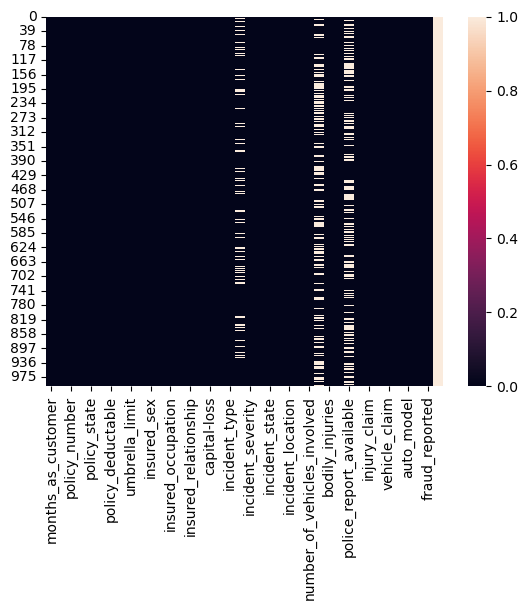

In [12]:
sns.heatmap(df.isnull())

We can see that the incident_type,number of vehciles involved,police report available has the null value

We are converting the data which are in date format into date,month, year

In [13]:
df['policy_bind_date']=pd.to_datetime(df['policy_bind_date'])
df['incident_date']=pd.to_datetime(df['incident_date'])

In [14]:
df['policy_bind_date']=pd.to_datetime(df['policy_bind_date'])
df['policy_bind_date']=df['policy_bind_date'].dt.day

In [15]:
df['policy_bind_date']=pd.to_datetime(df['policy_bind_date'])
df['policy_bind_date']=df['policy_bind_date'].dt.month

In [16]:
df['policy_bind_date']=pd.to_datetime(df['policy_bind_date'])
df['policy_bind_date']=df['policy_bind_date'].dt.year

In [17]:
df['incident_date']=pd.to_datetime(df['incident_date'])
df['incident_date']=df['incident_date'].dt.day

In [18]:
df['incident_date']=pd.to_datetime(df['incident_date'])
df['incident_date']=df['incident_date'].dt.month

In [19]:
df['incident_date']=pd.to_datetime(df['incident_date'])
df['incident_date']=df['incident_date'].dt.year

We are replacing the null values by mode value

In [20]:
df['property_damage'].fillna(df['property_damage'].mode()[0],inplace=True)
df['police_report_available'].fillna(df['police_report_available'].mode()[0],inplace=True)
df['collision_type'].fillna(df['collision_type'].mode()[0],inplace=True)

In [21]:
df['police_report_available'].fillna(df['police_report_available'].mode()[0],inplace=True)
df['collision_type'].fillna(df['collision_type'].mode()[0],inplace=True)
df['property_damage'].fillna(df['property_damage'].mode()[0],inplace=True)

<Axes: >

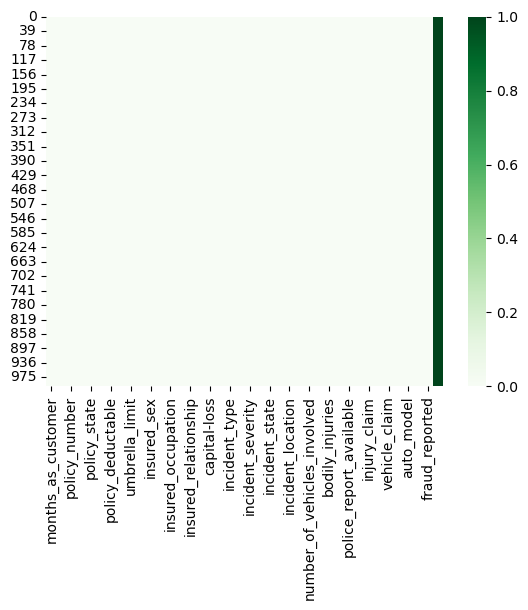

In [22]:
sns.heatmap(df.isnull(),cmap='Greens')

Now we can see there is no null values are present in the dataset

In [23]:
df['CSL_Person']=df.policy_csl.str.split('/',expand=True)[0]
df['CSL_Acci']=df.policy_csl.str.split('/',expand=True)[1]

In [24]:
df.nunique()

months_as_customer              391
age                              46
policy_number                  1000
policy_bind_date                  1
policy_state                      3
policy_csl                        3
policy_deductable                 3
policy_annual_premium           991
umbrella_limit                   11
insured_zip                     995
insured_sex                       2
insured_education_level           7
insured_occupation               14
insured_hobbies                  20
insured_relationship              6
capital-gains                   338
capital-loss                    354
incident_date                     1
incident_type                     4
collision_type                    3
incident_severity                 4
authorities_contacted             5
incident_state                    7
incident_city                     7
incident_location              1000
incident_hour_of_the_day         24
number_of_vehicles_involved       4
property_damage             

In [25]:
for k in df.columns:
    print(df[k].value_counts())
    print('\n')

194    8
128    7
254    7
140    7
210    7
      ..
390    1
411    1
453    1
448    1
17     1
Name: months_as_customer, Length: 391, dtype: int64


43    49
39    48
41    45
34    44
38    42
30    42
31    42
37    41
33    39
40    38
32    38
29    35
46    33
42    32
35    32
36    32
44    32
28    30
26    26
45    26
48    25
47    24
27    24
57    16
25    14
55    14
49    14
53    13
50    13
24    10
54    10
61    10
51     9
60     9
58     8
56     8
23     7
21     6
59     5
62     4
52     4
64     2
63     2
19     1
20     1
22     1
Name: age, dtype: int64


521585    1
687755    1
674485    1
223404    1
991480    1
         ..
563878    1
620855    1
583169    1
337677    1
556080    1
Name: policy_number, Length: 1000, dtype: int64


1970    1000
Name: policy_bind_date, dtype: int64


OH    352
IL    338
IN    310
Name: policy_state, dtype: int64


250/500     351
100/300     349
500/1000    300
Name: policy_csl, dtype: int64


1000    351
500     342
200

In [26]:
df.describe()

,months_as_customer,age,policy_number,policy_bind_date,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,...,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year,_c39
count,1000.000000,1000.000000,1000.000000,1000.0,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,...,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000,0.0
mean,203.954000,38.948000,546238.648000,1970.0,1136.000000,1256.406150,1.101000e+06,501214.488000,25126.100000,-26793.700000,...,11.644000,1.83900,0.992000,1.487000,52761.94000,7433.420000,7399.570000,37928.950000,2005.103000,NaN
std,115.113174,9.140287,257063.005276,0.0,611.864673,244.167395,2.297407e+06,71701.610941,27872.187708,28104.096686,...,6.951373,1.01888,0.820127,1.111335,26401.53319,4880.951853,4824.726179,18886.252893,6.015861,NaN
min,0.000000,19.000000,100804.000000,1970.0,500.000000,433.330000,-1.000000e+06,430104.000000,0.000000,-111100.000000,...,0.000000,1.00000,0.000000,0.000000,100.00000,0.000000,0.000000,70.000000,1995.000000,NaN
25%,115.750000,32.000000,335980.250000,1970.0,500.000000,1089.607500,0.000000e+00,448404.500000,0.000000,-51500.000000,...,6.000000,1.00000,0.000000,1.000000,41812.50000,4295.000000,4445.000000,30292.500000,2000.000000,NaN
50%,199.500000,38.000000,533135.000000,1970.0,1000.000000,1257.200000,0.000000e+00,466445.500000,0.000000,-23250.000000,...,12.000000,1.00000,1.000000,1.000000,58055.00000,6775.000000,6750.000000,42100.000000,2005.000000,NaN
75%,276.250000,44.000000,759099.750000,1970.0,2000.000000,1415.695000,0.000000e+00,603251.000000,51025.000000,0.000000,...,17.000000,3.00000,2.000000,2.000000,70592.50000,11305.000000,10885.000000,50822.500000,2010.000000,NaN
max,479.000000,64.000000,999435.000000,1970.0,2000.000000,2047.590000,1.000000e+07,620962.000000,100500.000000,0.000000,...,23.000000,4.00000,2.000000,3.000000,114920.00000,21450.000000,23670.000000,79560.000000,2015.000000,NaN


As we can see from the above statsitcal summary that:

1.Month as coustomer,age,policy deductable,insured_zip,captal gains,number of vehicle involved,witnesses,injury claim shows right hand side skewness since mean is greater than median

2.Incident hours of day, bodily injuries,vehcile claim shows left side skewness since mean is less than median

3.For policy number,policy annual premium,capital gains shows sudden increase in value between 75% quantile and max values which shows there will be presence of outlier in data we can confirm the presence of outliers by box-plot method

# EDA

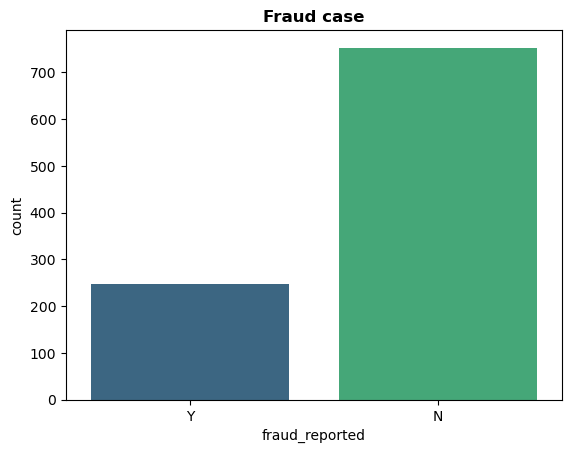

In [27]:
sns.countplot(x='fraud_reported',data=df,palette='viridis')
plt.title('Fraud case',fontweight='bold')
plt.show()

The count of No fraud reported is more compared to yes

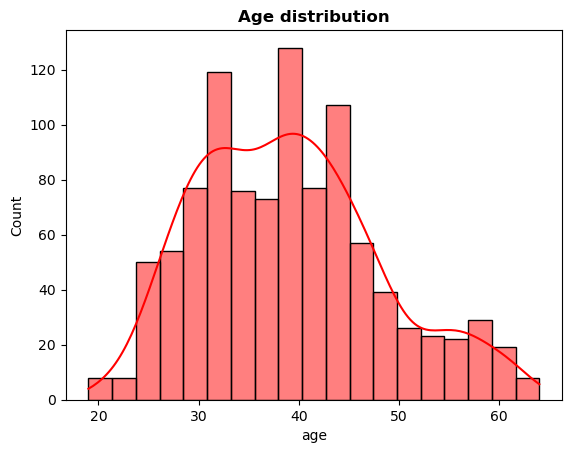

In [30]:
sns.histplot(x='age',data=df,kde=True,color='Red')
plt.title('Age distribution',fontweight='bold')
plt.show()

From graph we can see the age is normally distributed between30-50 years age

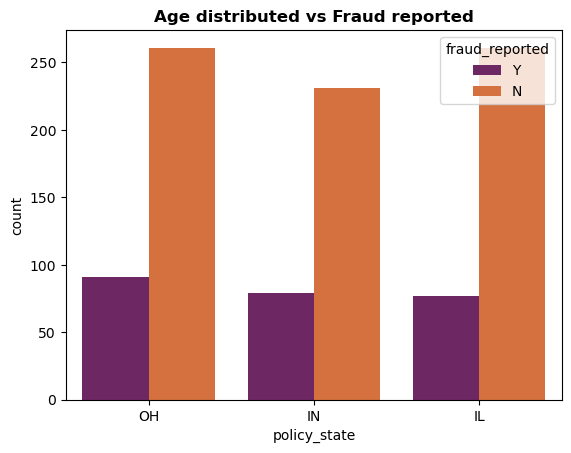

In [34]:
sns.countplot(x='policy_state',hue='fraud_reported',data=df,palette='inferno')
plt.title('Age distributed vs Fraud reported',fontweight='bold')
plt.show()

The count of Policy state with IL whose fraud not reported is more compared with IN policy state

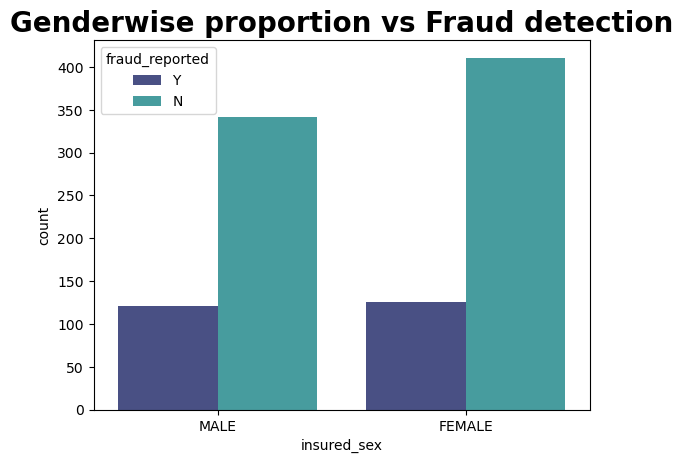

In [35]:
sns.countplot(x='insured_sex',hue='fraud_reported',data=df,palette='mako')
plt.title('Genderwise proportion vs Fraud detection',fontweight='bold',fontsize=20)
plt.show()

From countplot we can see the count of female is more compared to male

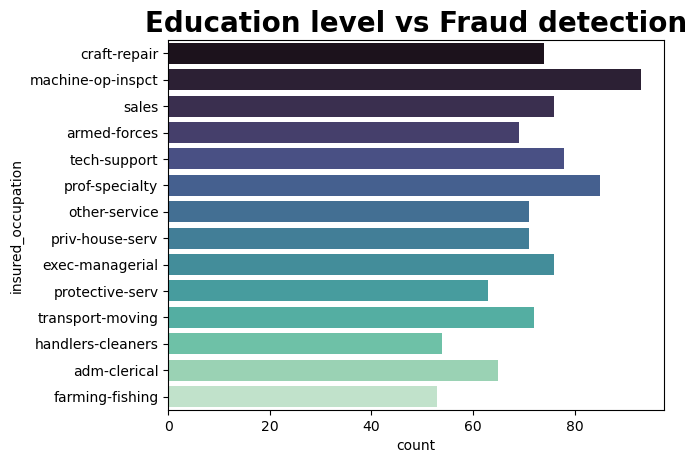

In [43]:
sns.countplot(y='insured_occupation',data=df,palette='mako')
plt.title('Education level vs Fraud detection',fontsize=20,fontweight='bold')
plt.show()

Count of Machine-op-inspct is more compared to all 

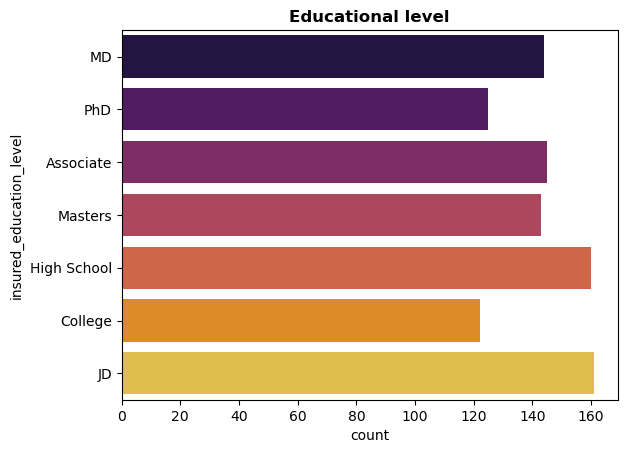

In [45]:
sns.countplot(y='insured_education_level',data=df,palette='inferno')
plt.title('Educational level',fontweight='bold')
plt.show()

From count we can see the JD has the highest count and college has least count

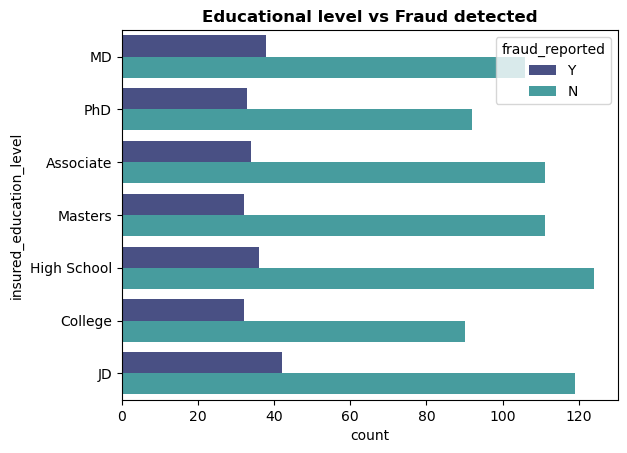

In [46]:
sns.countplot(y='insured_education_level',hue='fraud_reported',data=df,palette='mako')
plt.title('Educational level vs Fraud detected',fontweight='bold')
plt.show()

From countplot we can see the high school has the highest count followed by MD and JD and College has the least count

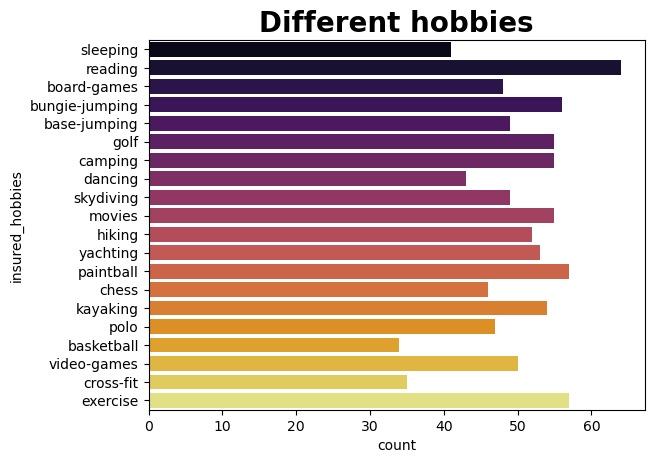

In [50]:
sns.countplot(y='insured_hobbies',data=df,palette='inferno')
plt.title('Different hobbies',fontweight='bold',fontsize=20)
plt.show()

On the basis of hobbies we can see reading has the highest count and basketball and cross-fit has the least count

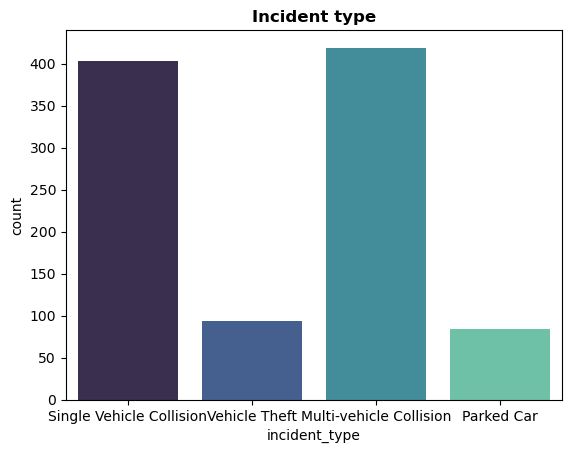

In [51]:
sns.countplot(x='incident_type',data=df,palette='mako')
plt.title('Incident type',fontweight='bold')
plt.show()

As we can see from the sountplot Multivehcile collision has the highest incident type and vehicle theft and parked car has the least count

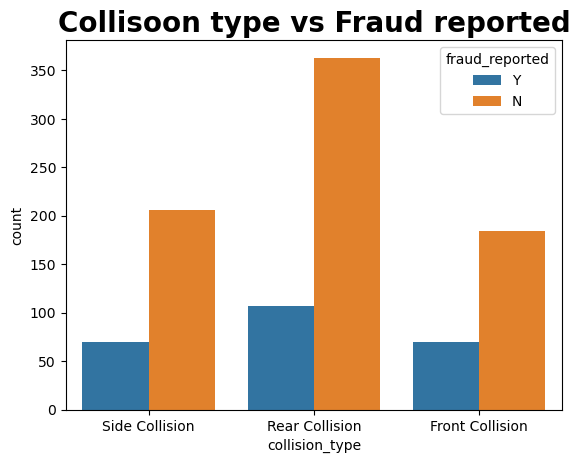

In [62]:
sns.countplot(x='collision_type',data=df,hue='fraud_reported')
plt.title('Collisoon type vs Fraud reported',fontweight='bold',fontsize=20)
plt.show()

Rear collision has the highest count for fraud reported and front collision has the least count for fraud reported

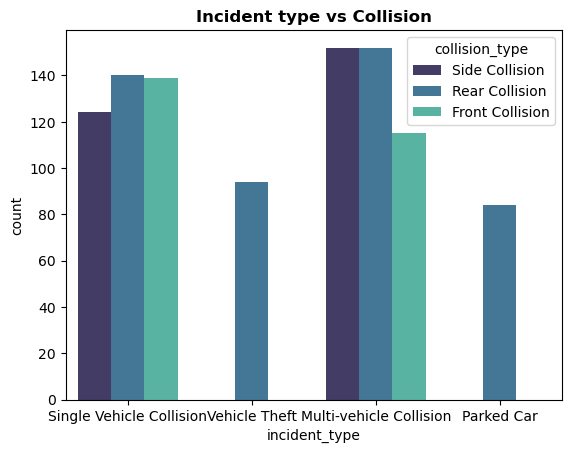

In [63]:
sns.countplot(x='incident_type',hue='collision_type',data=df,palette='mako')
plt.title('Incident type vs Collision',fontweight='bold')
plt.show()

Slide collision and Rear collision has the equal count while the front collision has the least count

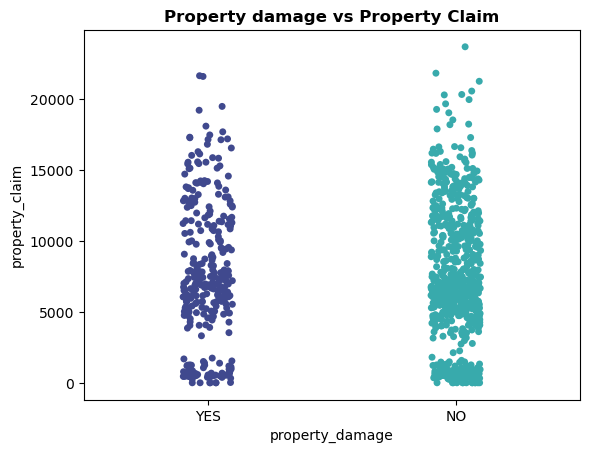

In [65]:
sns.stripplot(x='property_damage',y='property_claim',data=df,palette='mako')
plt.title('Property damage vs Property Claim',fontweight='bold')
plt.show()


As from stripplot we can see that the Count of property claim with No damage is more compared to the yes with the property damage

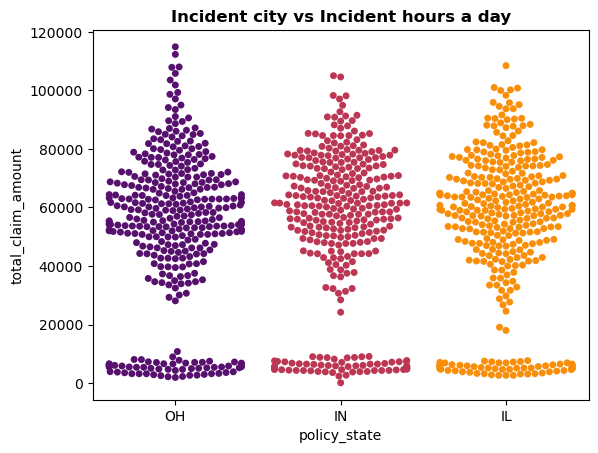

In [74]:
sns.swarmplot(x='policy_state',y='total_claim_amount',data=df,palette='inferno')
plt.title('Incident city vs Incident hours a day',fontweight='bold')
plt.show()

From swarmplot we can see that the for the OH policy state has the highest total claim amount

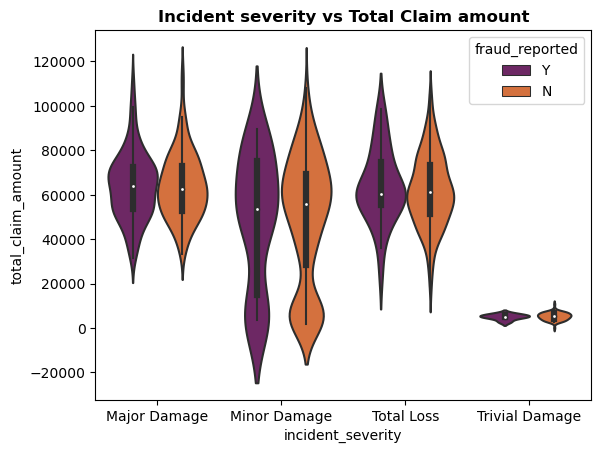

In [77]:
sns.violinplot(x='incident_severity',y='total_claim_amount',hue='fraud_reported',data=df,palette='inferno')
plt.title('Incident severity vs Total Claim amount',fontweight='bold')
plt.show()

from the violinplot trivial damage has the least count for fraud reported,and the Minor damage has the highest count for the fraud reported

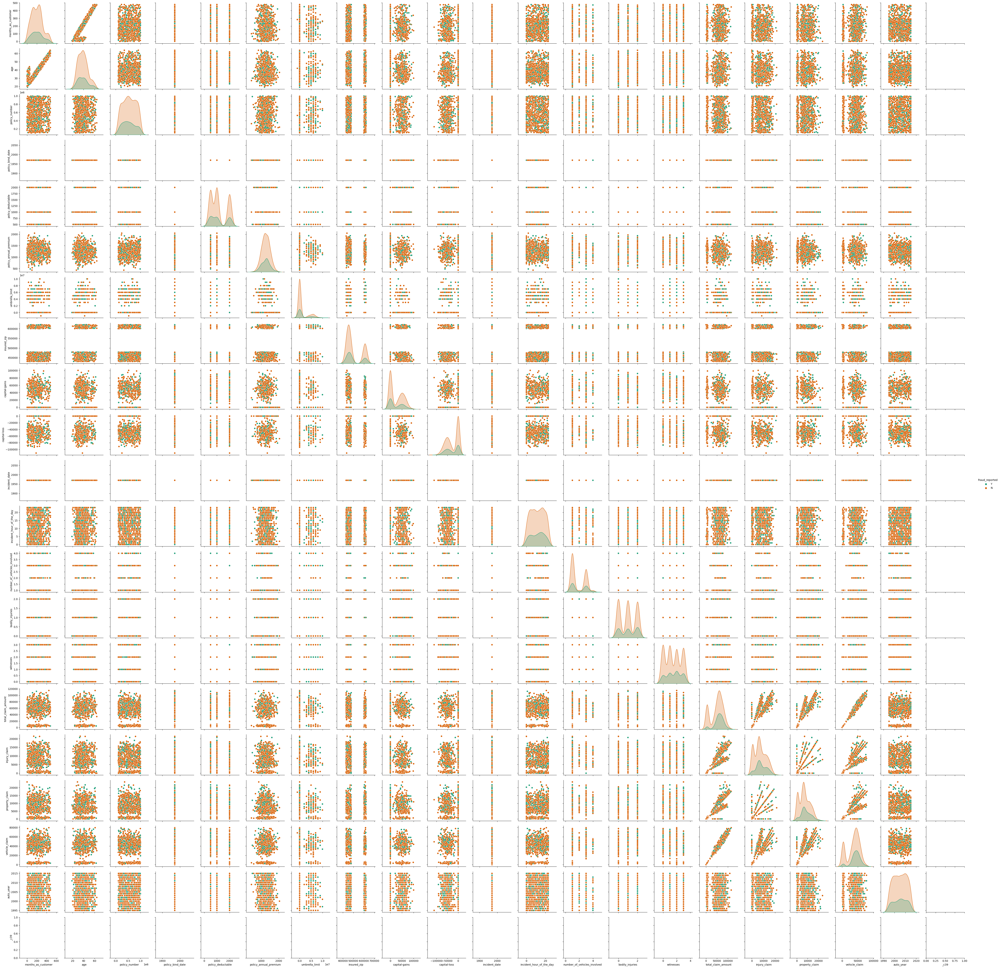

In [78]:
sns.pairplot(data=df,hue='fraud_reported',palette='Dark2')

months_as_customer                Axes(0.125,0.747241;0.133621x0.132759)
age                            Axes(0.285345,0.747241;0.133621x0.132759)
policy_number                   Axes(0.44569,0.747241;0.133621x0.132759)
policy_bind_date               Axes(0.606034,0.747241;0.133621x0.132759)
policy_deductable              Axes(0.766379,0.747241;0.133621x0.132759)
policy_annual_premium             Axes(0.125,0.587931;0.133621x0.132759)
umbrella_limit                 Axes(0.285345,0.587931;0.133621x0.132759)
insured_zip                     Axes(0.44569,0.587931;0.133621x0.132759)
capital-gains                  Axes(0.606034,0.587931;0.133621x0.132759)
capital-loss                   Axes(0.766379,0.587931;0.133621x0.132759)
incident_date                     Axes(0.125,0.428621;0.133621x0.132759)
incident_hour_of_the_day       Axes(0.285345,0.428621;0.133621x0.132759)
number_of_vehicles_involved     Axes(0.44569,0.428621;0.133621x0.132759)
bodily_injuries                Axes(0.606034,0.4286

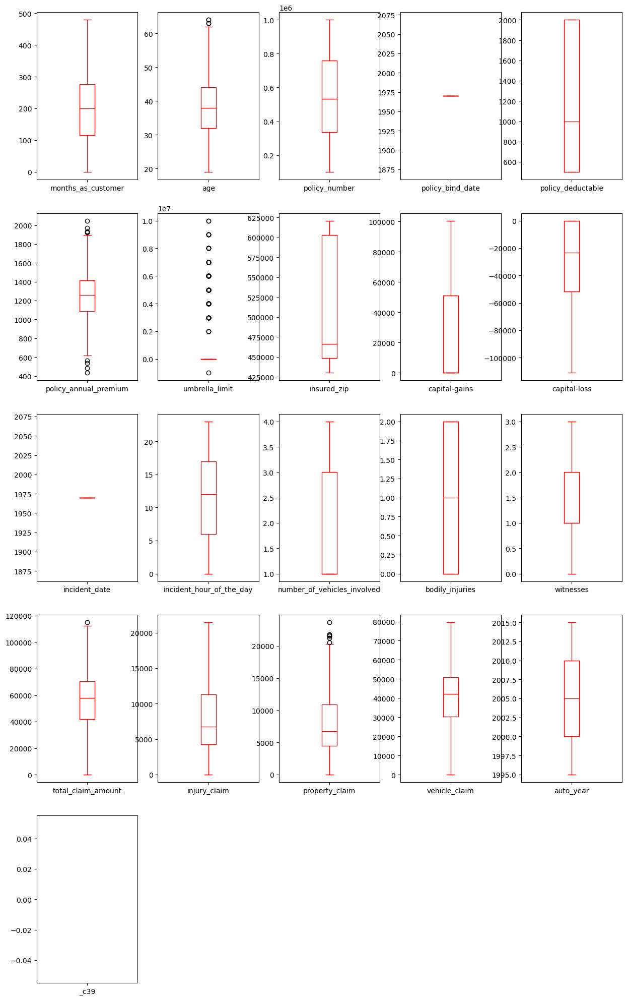

In [79]:
df.plot(kind='box',subplots=True,layout=(5,5),figsize=(15,25),color='Red')

From boxplot we can see that the Age,Policy annual premium,umbrella limit,property claim has the outlier so we can remove the outliers using zscore method

In [80]:
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39,CSL_Person,CSL_Acci
0,328,48,521585,1970,OH,250/500,1000,1406.91,0,466132,...,6510,13020,52080,Saab,92x,2004,Y,NaN,250,500
1,228,42,342868,1970,IN,250/500,2000,1197.22,5000000,468176,...,780,780,3510,Mercedes,E400,2007,Y,NaN,250,500
2,134,29,687698,1970,OH,100/300,2000,1413.14,5000000,430632,...,7700,3850,23100,Dodge,RAM,2007,N,NaN,100,300
3,256,41,227811,1970,IL,250/500,2000,1415.74,6000000,608117,...,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN,250,500
4,228,44,367455,1970,IL,500/1000,1000,1583.91,6000000,610706,...,1300,650,4550,Accura,RSX,2009,N,NaN,500,1000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,1970,OH,500/1000,1000,1310.80,0,431289,...,17440,8720,61040,Honda,Accord,2006,N,NaN,500,1000
996,285,41,186934,1970,IL,100/300,1000,1436.79,0,608177,...,18080,18080,72320,Volkswagen,Passat,2015,N,NaN,100,300
997,130,34,918516,1970,OH,250/500,500,1383.49,3000000,442797,...,7500,7500,52500,Suburu,Impreza,1996,N,NaN,250,500
998,458,62,533940,1970,IL,500/1000,2000,1356.92,5000000,441714,...,5220,5220,36540,Audi,A5,1998,N,NaN,500,1000


In [81]:
df.skew()

months_as_customer             0.362177
age                            0.478988
policy_number                  0.038991
policy_bind_date               0.000000
policy_deductable              0.477887
policy_annual_premium          0.004402
umbrella_limit                 1.806712
insured_zip                    0.816554
capital-gains                  0.478850
capital-loss                  -0.391472
incident_date                  0.000000
incident_hour_of_the_day      -0.035584
number_of_vehicles_involved    0.502664
bodily_injuries                0.014777
witnesses                      0.019636
total_claim_amount            -0.594582
injury_claim                   0.264811
property_claim                 0.378169
vehicle_claim                 -0.621098
auto_year                     -0.048289
_c39                                NaN
CSL_Person                     0.410015
CSL_Acci                       0.605587
dtype: float64

As we can see umbrella limit has the skewness so we have to remove the skewness

In [82]:
df['umbrella_limit']=np.cbrt(df['umbrella_limit'])

In [83]:
df.skew()

months_as_customer             0.362177
age                            0.478988
policy_number                  0.038991
policy_bind_date               0.000000
policy_deductable              0.477887
policy_annual_premium          0.004402
umbrella_limit                 1.523380
insured_zip                    0.816554
capital-gains                  0.478850
capital-loss                  -0.391472
incident_date                  0.000000
incident_hour_of_the_day      -0.035584
number_of_vehicles_involved    0.502664
bodily_injuries                0.014777
witnesses                      0.019636
total_claim_amount            -0.594582
injury_claim                   0.264811
property_claim                 0.378169
vehicle_claim                 -0.621098
auto_year                     -0.048289
_c39                                NaN
CSL_Person                     0.410015
CSL_Acci                       0.605587
dtype: float64

In [84]:
category=[]
for i in df.dtypes.index:
    if df.dtypes[i]=='object':
        category.append(i)
print('Category columns:',category)

numerical=[]
for i in df.dtypes.index:
    if df.dtypes[i]!='object':
        numerical.append(i)
print('Numerical columns:',numerical)

Category columns: ['policy_state', 'policy_csl', 'insured_sex', 'insured_education_level', 'insured_occupation', 'insured_hobbies', 'insured_relationship', 'incident_type', 'collision_type', 'incident_severity', 'authorities_contacted', 'incident_state', 'incident_city', 'incident_location', 'property_damage', 'police_report_available', 'auto_make', 'auto_model', 'fraud_reported', 'CSL_Person', 'CSL_Acci']
Numerical columns: ['months_as_customer', 'age', 'policy_number', 'policy_bind_date', 'policy_deductable', 'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'capital-gains', 'capital-loss', 'incident_date', 'incident_hour_of_the_day', 'number_of_vehicles_involved', 'bodily_injuries', 'witnesses', 'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim', 'auto_year', '_c39']


Now we are converting the object data into the int using LabelEncoder

In [85]:
from sklearn.preprocessing import LabelEncoder
len=LabelEncoder()

for k in category:
    df[k]=len.fit_transform(df[k])
df.head(5)

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39,CSL_Person,CSL_Acci
0,328,48,521585,1970,2,1,1000,1406.91,0.000000,466132,...,6510,13020,52080,10,1,2004,1,NaN,1,2
1,228,42,342868,1970,1,1,2000,1197.22,170.997595,468176,...,780,780,3510,8,12,2007,1,NaN,1,2
2,134,29,687698,1970,2,0,2000,1413.14,170.997595,430632,...,7700,3850,23100,4,30,2007,0,NaN,0,1
3,256,41,227811,1970,0,1,2000,1415.74,181.712059,608117,...,6340,6340,50720,3,34,2014,1,NaN,1,2
4,228,44,367455,1970,0,2,1000,1583.91,181.712059,610706,...,1300,650,4550,0,31,2009,0,NaN,2,0


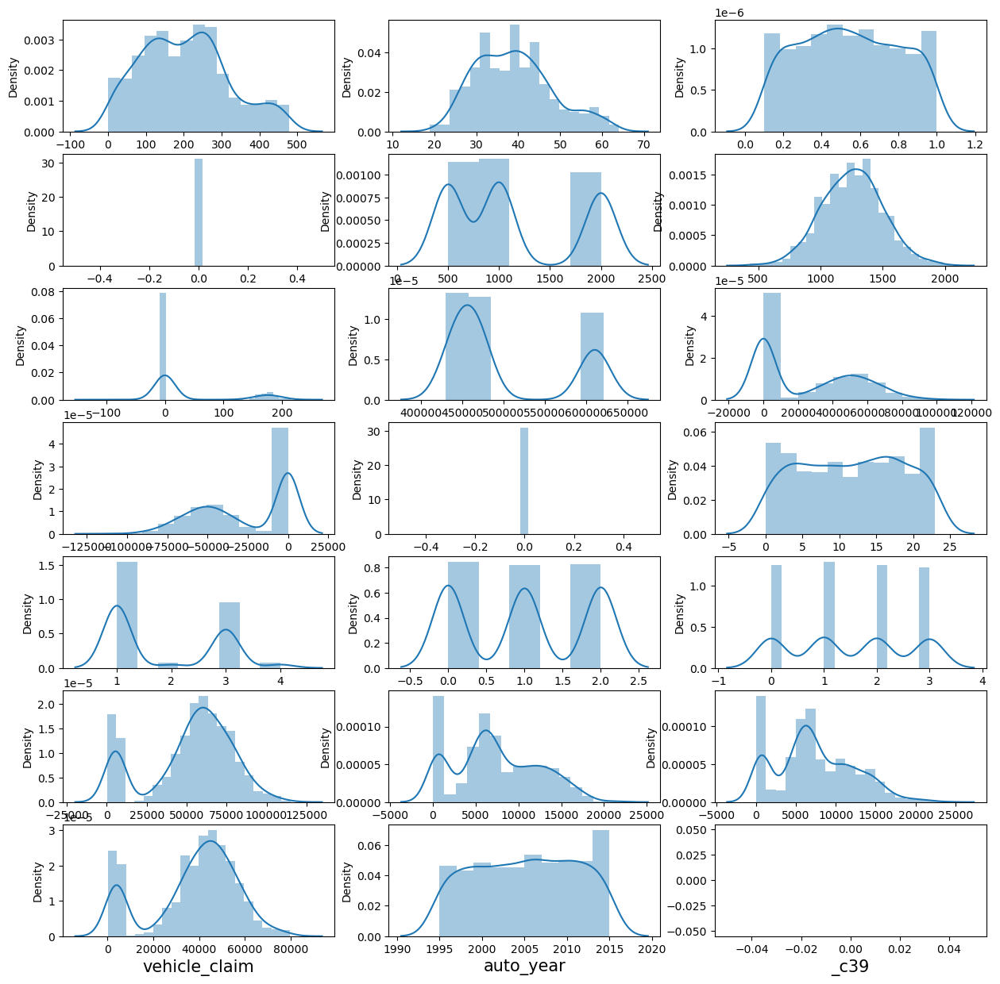

In [86]:
plt.figure(figsize=(15,15))
plotnum=1
for k in numerical:
    if plotnum<=21:
        plt.subplot(7,3,plotnum)
        sns.distplot(df[k])
        plt.xlabel(k,fontsize=15)
    plotnum+=1
plt.show()

In [87]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 42 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   int64  
 4   policy_state                 1000 non-null   int32  
 5   policy_csl                   1000 non-null   int32  
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   float64
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   int32  
 11  insured_education_level      1000 non-null   int32  
 12  insured_occupation           1000 non-null   int32  
 13  insured_hobbies    

In [88]:
df.corr()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39,CSL_Person,CSL_Acci
months_as_customer,1.000000,0.922098,0.057555,NaN,-0.000328,-0.026819,0.026807,0.005018,0.006925,0.017895,...,0.065329,0.034940,0.061013,0.047655,0.004202,-0.000292,0.020544,NaN,-0.026819,0.008876
age,0.922098,1.000000,0.059413,NaN,-0.014533,-0.015185,0.029188,0.014404,0.005124,0.025604,...,0.075522,0.060898,0.062588,0.030410,0.017343,0.001354,0.012143,NaN,-0.015185,0.009876
policy_number,0.057555,0.059413,1.000000,NaN,0.072815,0.038917,-0.006738,0.022566,0.002078,0.007083,...,-0.008762,-0.010678,-0.020184,0.023860,0.065240,-0.000183,-0.029443,NaN,0.038917,0.045590
policy_bind_date,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
policy_state,-0.000328,-0.014533,0.072815,NaN,1.000000,0.001027,0.010033,0.012455,-0.023417,0.008777,...,-0.046290,0.008406,0.001425,0.017124,-0.025253,0.002114,0.029432,NaN,0.001027,0.028838
policy_csl,-0.026819,-0.015185,0.038917,NaN,0.001027,1.000000,0.003384,0.023978,0.018837,0.006879,...,-0.078818,-0.042216,-0.046791,-0.004701,0.047885,-0.033082,-0.037190,NaN,1.000000,-0.459462
policy_deductable,0.026807,0.029188,-0.006738,NaN,0.010033,0.003384,1.000000,-0.003245,0.004760,0.004545,...,0.039107,0.064792,0.005269,-0.035379,-0.003268,0.026105,0.014817,NaN,0.003384,-0.003931
policy_annual_premium,0.005018,0.014404,0.022566,NaN,0.012455,0.023978,-0.003245,1.000000,-0.003582,0.032354,...,-0.017633,-0.011654,0.020246,0.000045,-0.031849,-0.049226,-0.014480,NaN,0.023978,0.003813
umbrella_limit,0.006925,0.005124,0.002078,NaN,-0.023417,0.018837,0.004760,-0.003582,1.000000,0.012630,...,-0.043855,-0.022295,-0.038770,0.005630,0.031389,0.010392,0.060104,NaN,0.018837,0.023237
insured_zip,0.017895,0.025604,0.007083,NaN,0.008777,0.006879,0.004545,0.032354,0.012630,1.000000,...,-0.017495,-0.006841,-0.041083,-0.020892,0.023637,-0.032736,0.019368,NaN,0.006879,0.005428


Now we are dropping the unnecessary columns from our dataset

In [89]:
drop=['_c39','incident_location','insured_zip','policy_csl','policy_number','policy_bind_date','incident_date','incident_state','incident_state','incident_city','insured_hobbies','auto_make','auto_model','auto_year']
df.drop(drop,axis=1,inplace=True)

<Axes: >

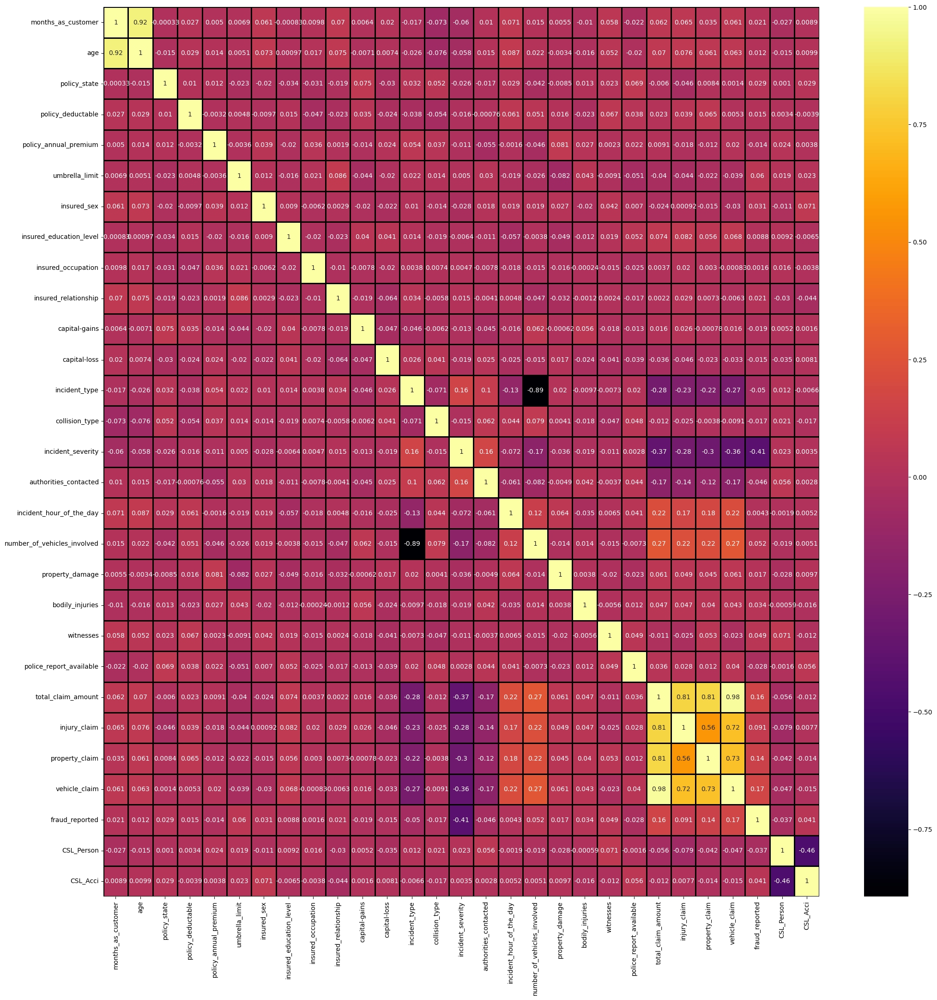

In [90]:
plt.figure(figsize=(25,25))
sns.heatmap(df.corr(),annot=True,cmap='inferno',linewidths=2,linecolor='Black',fmt='.02g')

In [91]:
from scipy.stats import zscore
z=np.abs(zscore(df))
print(np.where(z>3))

df1=df[(z<3).all(axis=1)]
df1

(array([229, 248, 500, 763, 807], dtype=int64), array([ 4,  4, 24,  4, 11], dtype=int64))


,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_relationship,...,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,fraud_reported,CSL_Person,CSL_Acci
0,328,48,2,1000,1406.91,0.000000,1,4,2,0,...,1,2,1,71610,6510,13020,52080,1,1,2
1,228,42,1,2000,1197.22,170.997595,1,4,6,2,...,0,0,0,5070,780,780,3510,1,1,2
2,134,29,2,2000,1413.14,170.997595,0,6,11,3,...,2,3,0,34650,7700,3850,23100,0,0,1
3,256,41,0,2000,1415.74,181.712059,0,6,1,4,...,1,2,0,63400,6340,6340,50720,1,1,2
4,228,44,0,1000,1583.91,181.712059,1,0,11,4,...,0,1,0,6500,1300,650,4550,0,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,2,1000,1310.80,0.000000,0,5,2,4,...,0,1,0,87200,17440,8720,61040,0,2,0
996,285,41,0,1000,1436.79,0.000000,0,6,9,5,...,2,3,0,108480,18080,18080,72320,0,0,1
997,130,34,2,500,1383.49,144.224957,0,5,1,2,...,2,3,1,67500,7500,7500,52500,0,1,2
998,458,62,0,2000,1356.92,170.997595,1,0,5,5,...,0,1,1,46980,5220,5220,36540,0,2,0


Now we are seperating the target variable

In [92]:
x=df.drop('fraud_reported',axis=1)
y=df['fraud_reported']

In [93]:
x

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_relationship,...,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,CSL_Person,CSL_Acci
0,328,48,2,1000,1406.91,0.000000,1,4,2,0,...,1,1,2,1,71610,6510,13020,52080,1,2
1,228,42,1,2000,1197.22,170.997595,1,4,6,2,...,0,0,0,0,5070,780,780,3510,1,2
2,134,29,2,2000,1413.14,170.997595,0,6,11,3,...,0,2,3,0,34650,7700,3850,23100,0,1
3,256,41,0,2000,1415.74,181.712059,0,6,1,4,...,0,1,2,0,63400,6340,6340,50720,1,2
4,228,44,0,1000,1583.91,181.712059,1,0,11,4,...,0,0,1,0,6500,1300,650,4550,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,2,1000,1310.80,0.000000,0,5,2,4,...,1,0,1,0,87200,17440,8720,61040,2,0
996,285,41,0,1000,1436.79,0.000000,0,6,9,5,...,1,2,3,0,108480,18080,18080,72320,0,1
997,130,34,2,500,1383.49,144.224957,0,5,1,2,...,0,2,3,1,67500,7500,7500,52500,1,2
998,458,62,0,2000,1356.92,170.997595,1,0,5,5,...,0,0,1,1,46980,5220,5220,36540,2,0


In [94]:
y.value_counts()

0    753
1    247
Name: fraud_reported, dtype: int64

In [95]:
from sklearn.decomposition import PCA
pca=PCA(n_components=28)
xn=pca.fit_transform(x)

In [96]:
x=pd.DataFrame(xn,columns=np.arange(28))
x

,0,1,2,3,4,5,6,7,8,9,...,18,19,20,21,22,23,24,25,26,27
0,22130.089277,-4830.470468,39550.927861,1087.427373,4590.820169,-167.505330,-141.986983,121.687997,-31.655805,-7.907351,...,-1.371665,-0.459386,-0.466034,-0.831437,0.685950,0.470471,0.051542,0.727564,-0.189808,1.306838e-11
1,-63771.300201,-28597.855350,-3353.702720,-744.159828,-90.795251,904.264714,60.336992,32.050280,128.634103,-1.425678,...,-0.894692,0.476894,-0.934634,0.186129,0.634732,0.385162,-0.061550,-0.387031,0.561094,1.267132e-11
2,-25769.821535,-10465.333011,24320.143722,-2483.279082,-2598.983723,858.654148,-162.536198,-75.052592,138.528963,-3.695303,...,-0.794496,-1.006326,0.698880,0.317131,-0.969683,-0.382148,-0.201488,-0.305962,0.074413,1.069548e-11
3,21184.753918,40049.242336,-4775.819556,6037.886901,-142.732273,913.991251,-143.832439,48.387498,147.046556,-8.008645,...,-0.707184,1.641940,0.190308,0.694828,0.522562,-0.693266,-0.241509,-0.353615,-0.035253,5.256834e-12
4,-52406.667934,48526.788079,16592.610634,-600.768746,-225.777028,-163.374919,-344.086414,39.042749,145.458011,11.459093,...,-0.335670,1.523293,-0.804394,0.017729,-0.025985,0.455006,0.181082,-0.326163,0.605524,-3.720844e-12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,37077.748046,-41885.190973,-202.825956,-1925.918441,-6190.393281,-104.110012,-49.443365,-219.170167,-26.993734,7.863023,...,-0.164433,-0.835235,-0.990486,1.299526,-0.088010,-0.306424,-0.754356,0.386849,0.047734,-9.697718e-13
996,65990.826198,1011.050822,54193.827975,-5897.713982,446.531367,-266.960340,-196.068347,62.817313,-22.452492,8.267537,...,-0.201871,1.075034,1.188880,-0.447276,-0.606541,-0.332792,-0.619913,0.300260,-0.011243,2.618142e-12
997,17434.955970,-16194.340660,25678.642239,4614.917421,-285.769898,-568.725891,-104.174149,-77.044172,114.624636,-7.481449,...,-0.463337,-1.264727,0.441138,-0.692830,0.501057,-0.575835,0.421886,0.194435,0.053480,4.076160e-12
998,-10660.235182,-35616.289482,-1689.149942,2998.489795,-300.011889,944.322395,-80.725188,250.819199,130.781779,-10.403952,...,-0.807803,1.324443,-0.877858,-0.152313,0.222267,0.367112,0.900529,0.259349,-0.159452,3.404724e-12


In [97]:
from sklearn.preprocessing import StandardScaler
scale=StandardScaler()
x=pd.DataFrame(scale.fit_transform(x),columns=x.columns)
x

,0,1,2,3,4,5,6,7,8,9,...,18,19,20,21,22,23,24,25,26,27
0,0.673863,-0.169169,1.449038,0.273527,1.435394,-0.275549,-0.583136,1.058105,-0.449668,-1.169652,...,-1.583489,-0.558629,-0.573044,-1.173547,1.169242,0.953558,0.111965,1.629620,-0.560582,3.599731
1,-1.941842,-1.001534,-0.122871,-0.187183,-0.028389,1.487529,0.247802,0.278684,1.827236,-0.210886,...,-1.032858,0.579920,-1.149244,0.262715,1.081937,0.780652,-0.133705,-0.866885,1.657141,3.460464
2,-0.784694,-0.366510,0.891024,-0.624635,-0.812614,1.412499,-0.667531,-0.652599,1.967791,-0.546608,...,-0.917189,-1.223728,0.859356,0.447620,-1.652880,-0.774543,-0.437690,-0.685303,0.219772,2.767433
3,0.645078,1.402577,-0.174973,1.518747,-0.044628,1.503530,-0.590715,0.420740,2.088783,-1.184635,...,-0.816394,1.996656,0.234006,0.980727,0.890738,-1.405121,-0.524628,-0.792038,-0.104115,0.859820
4,-1.595788,1.699472,0.607908,-0.151115,-0.070593,-0.268754,-1.413151,0.339485,2.066218,1.695024,...,-0.387507,1.852377,-0.989098,0.025024,-0.044293,0.922213,0.393362,-0.730551,1.788361,-2.289115
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,1.129021,-1.466874,-0.007431,-0.484438,-1.935526,-0.171263,-0.203062,-1.905734,-0.383444,1.163095,...,-0.189826,-1.015675,-1.217921,1.834239,-0.150018,-0.621064,-1.638681,0.866475,0.140977,-1.324172
996,2.009427,0.035408,1.985514,-1.483488,0.139615,-0.439154,-0.805246,0.546211,-0.318936,1.222930,...,-0.233046,1.307279,1.461870,-0.631316,-1.033885,-0.674508,-1.346632,0.672532,-0.033204,-0.065705
997,0.530896,-0.567147,0.940795,1.160819,-0.089351,-0.935563,-0.427840,-0.669916,1.628233,-1.106653,...,-0.534890,-1.537951,0.542432,-0.977907,0.854081,-1.167112,0.916459,0.435501,0.157947,0.445697
998,-0.324605,-1.247329,-0.061886,0.754229,-0.093804,1.553425,-0.331536,2.180929,1.857743,-1.538948,...,-0.932551,1.610568,-1.079431,-0.214985,0.378867,0.744069,1.956211,0.580899,-0.470927,0.210189


In [98]:
from imblearn.over_sampling import SMOTE
smt=SMOTE()
x1,y1=smt.fit_resample(x,y)

We are balacing the target variable

In [99]:
y1.value_counts()

1    753
0    753
Name: fraud_reported, dtype: int64

# Modelling

In [100]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier,ExtraTreesClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier,AdaBoostClassifier
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report

In [101]:
maxAccu=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test=train_test_split(x1,y1,test_size=0.30,random_state=i)
    RF=RandomForestClassifier()
    RF.fit(x_train,y_train)
    rfpred=RF.predict(x_test)
    acc=accuracy_score(y_test,rfpred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print('Maximum accuracy score is:',maxAccu,'at random state:',maxRS)
        

Maximum accuracy score is: 0.8982300884955752 at random state: 84


In [102]:
ET=ExtraTreesClassifier()
lg=LogisticRegression()
svc=SVC()
rf=RandomForestClassifier()
knn=KNeighborsClassifier()
dtc=DecisionTreeClassifier()
gb=GradientBoostingClassifier()

model=[svc,rf,knn,dtc,gb,lg,ET]

for mod in model:
    mod.fit(x_train,y_train)
    predict=mod.predict(x_test)
    print('Accuracy score of:',mod)
    acc=accuracy_score(y_test,predict)
    print('Accuracy score is:',acc)
    print('Confusion matrix',confusion_matrix(y_test,predict))
    print('Classification report',classification_report(y_test,predict))
    print("---------------------------------------------------------------")

Accuracy score of: SVC()
Accuracy score is: 0.8495575221238938
Confusion matrix [[177  39]
 [ 29 207]]
Classification report               precision    recall  f1-score   support

           0       0.86      0.82      0.84       216
           1       0.84      0.88      0.86       236

    accuracy                           0.85       452
   macro avg       0.85      0.85      0.85       452
weighted avg       0.85      0.85      0.85       452

---------------------------------------------------------------
Accuracy score of: RandomForestClassifier()
Accuracy score is: 0.8584070796460177
Confusion matrix [[184  32]
 [ 32 204]]
Classification report               precision    recall  f1-score   support

           0       0.85      0.85      0.85       216
           1       0.86      0.86      0.86       236

    accuracy                           0.86       452
   macro avg       0.86      0.86      0.86       452
weighted avg       0.86      0.86      0.86       452

-------------

In [103]:
from sklearn.model_selection import cross_val_score

for mod in model:
    print('Cross validation score:',mod)
    score=cross_val_score(mod,x1,y1,cv=5)
    print(score)
    crossvalscore=score.mean()
    print('Cross validation score:',crossvalscore)
    print('Difference between cross validation score and accuracy:',abs(acc-crossvalscore))
    print('_______________________________________________________________________________')

Cross validation score: SVC()
[0.79139073 0.82392027 0.8538206  0.92026578 0.88039867]
Cross validation score: 0.8539592088182879
Difference between cross validation score and accuracy: 0.028784154013570484
_______________________________________________________________________________
Cross validation score: RandomForestClassifier()
[0.81456954 0.85049834 0.88372093 0.90033223 0.89700997]
Cross validation score: 0.8692261996435722
Difference between cross validation score and accuracy: 0.013517163188286219
_______________________________________________________________________________
Cross validation score: KNeighborsClassifier()
[0.69205298 0.71096346 0.75415282 0.74418605 0.75415282]
Cross validation score: 0.7311016259268223
Difference between cross validation score and accuracy: 0.15164173690503613
_______________________________________________________________________________
Cross validation score: DecisionTreeClassifier()
[0.72847682 0.77076412 0.72757475 0.78737542 0.80398671

As we can see the ExtraTreesclassifier shows the least difference between the accuracy and crossval score so we are selecting that the model 

# Hyperparameter Tunning

In [104]:
from sklearn.model_selection import GridSearchCV
param_grid={'criterion':['gini','entropy'],
           'max_depth':[10,20,30,50],
           'max_features':['auto','sqrt','log2'],
           'n_estimators':[100,200,300,400,500],
           'min_samples_split':[3,5,8,11]}
GV=GridSearchCV(ExtraTreesClassifier(),param_grid,cv=5)
GV.fit(x_train,y_train)
GV.best_params_

{'criterion': 'gini',
 'max_depth': 30,
 'max_features': 'log2',
 'min_samples_split': 3,
 'n_estimators': 200}

In [108]:
Final_Model=ExtraTreesClassifier(criterion='gini',max_depth=30,max_features='log2',min_samples_split=3,n_estimators=200)
Final_Model.fit(x_train,y_train)
Prediction=Final_Model.predict(x_test)
Accuracy=accuracy_score(y_test,Prediction)
Accuracy*100

89.60176991150442

As we can see ExtraTreesClassifier gives the 89% accuarcy score

# Saving the Model

In [109]:
import joblib
joblib.dump(Final_Model,'insurance_claim.pkl')

['insurance_claim.pkl']

In [110]:
Final_Model=joblib.load('insurance_claim.pkl')
Predictions=Final_Model.predict(x_test)
Predictions

array([0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1,
       1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0,
       0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0,
       0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1,
       1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0,
       1, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1,
       0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1,
       0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0,
       0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0,
       0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0,
       1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1,
       0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1,
       0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1,
       1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1,

In [111]:
kp=np.array(y_test)
K=pd.DataFrame()
K['Prediction']=Predictions
K['Originals']=kp
K

,Prediction,Originals
0,0,0
1,0,0
2,1,1
3,0,0
4,0,1
...,...,...
447,0,0
448,0,0
449,0,0
450,1,1
